# Wine exploration and clustering

# Data exploration

Libraries import

In [114]:
# General libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from warnings import filterwarnings # This filter was run after the finished notebook to avoid filtering important warnings
filterwarnings('ignore')

# Data exploration libraries
from requests import get
from io import StringIO
from ydata_profiling import ProfileReport
from IPython.display import HTML
from statsmodels.tsa.stattools import adfuller
from scipy import stats

# ML libraries
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, silhouette_score, accuracy_score, precision_score, recall_score, f1_score
sns.set(font_scale=0.7)

In [115]:
url = 'https://storage.googleapis.com/the_public_bucket/wine-clustering.csv' # Direct link to the dataset
response = get(url)

if response.status_code == 200:
    data = pd.read_csv(StringIO(response.text)) # Dataframe from the csv url
    print('Data retrieved successfully')
else:
    print(f'Failed to download dataset. Status code: {response.status_code}')

data.head(2)
print(f'Dataframe dimensions: {data.shape}')

# Saving data in its corresponding project folder
data.to_csv('../data/raw/raw_wine_clustering.csv', index=False)

Data retrieved successfully
Dataframe dimensions: (178, 13)


## Statistical analysis

There are no null, duplicated or infinite values

In [116]:
print(f'Total of null data: {data.isnull().sum().sum()}')
print(f'Total of duplicated data: {data.duplicated().sum()}')

inf_values = np.isinf(data)
inf_rows, inf_cols = np.where(inf_values)

print(f'Rows with inf values: {inf_rows.sum()}')
print(f'Columns with inf values: {inf_cols.sum()}')

Total of null data: 0
Total of duplicated data: 0
Rows with inf values: 0
Columns with inf values: 0


The datatypes are correct

In [117]:
print(f'Data information: \n{data.info()}')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Alcohol               178 non-null    float64
 1   Malic_Acid            178 non-null    float64
 2   Ash                   178 non-null    float64
 3   Ash_Alcanity          178 non-null    float64
 4   Magnesium             178 non-null    int64  
 5   Total_Phenols         178 non-null    float64
 6   Flavanoids            178 non-null    float64
 7   Nonflavanoid_Phenols  178 non-null    float64
 8   Proanthocyanins       178 non-null    float64
 9   Color_Intensity       178 non-null    float64
 10  Hue                   178 non-null    float64
 11  OD280                 178 non-null    float64
 12  Proline               178 non-null    int64  
dtypes: float64(11), int64(2)
memory usage: 18.2 KB
Data information: 
None


By the analysis of distribution made with the kurtosis and skewness tests, and the description about the data, it has been shown that there is not a common scale in the data, mean and standard deviation shows us how different the scale of the columns is. So, there will be needed a scaling before applying a ML model.

In [118]:
print(f'Data description: \n{data.describe()}')

Data description: 
          Alcohol  Malic_Acid         Ash  Ash_Alcanity   Magnesium  \
count  178.000000  178.000000  178.000000    178.000000  178.000000   
mean    13.000618    2.336348    2.366517     19.494944   99.741573   
std      0.811827    1.117146    0.274344      3.339564   14.282484   
min     11.030000    0.740000    1.360000     10.600000   70.000000   
25%     12.362500    1.602500    2.210000     17.200000   88.000000   
50%     13.050000    1.865000    2.360000     19.500000   98.000000   
75%     13.677500    3.082500    2.557500     21.500000  107.000000   
max     14.830000    5.800000    3.230000     30.000000  162.000000   

       Total_Phenols  Flavanoids  Nonflavanoid_Phenols  Proanthocyanins  \
count     178.000000  178.000000            178.000000       178.000000   
mean        2.295112    2.029270              0.361854         1.590899   
std         0.625851    0.998859              0.124453         0.572359   
min         0.980000    0.340000         

In [119]:
# Full distribution analysis
def calculate_stats(data: pd.DataFrame) -> list:
    """
    Calculate the mean, standard deviation, skewness, and kurtosis for each column in a DataFrame.

    Parameters:
    data (pd.DataFrame): The DataFrame for which to calculate statistics.

    Returns:
    mean (list): The mean of each column.
    std (list): The standard deviation of each column.
    skewness (list): The skewness of each column.
    kurtosis (list): The kurtosis of each column.
    """
    
    # Initialize lists to store results
    mean, std, skewness, kurtosis = [], [], [], []
    
    for column in data.columns:
        mean.append(data[column].mean())
        std.append(data[column].std())
        skewness.append(stats.skew(data[column]))
        kurtosis.append(stats.kurtosis(data[column]))
    
    # Return the calculated statistics
    return mean, std, skewness, kurtosis


#Usage of the function in the original data
mean, std, skewness, kurtosis = calculate_stats(data)

stats_data = pd.DataFrame({'Column': data.columns, 
                         'Mean': mean,
                         'Std': std,
                         'Skewness': skewness, 
                         'Kurtosis': kurtosis})
stats_data

,Column,Mean,Std,Skewness,Kurtosis
0,Alcohol,13.000618,0.811827,-0.051047,-0.862260
1,Malic_Acid,2.336348,1.117146,1.030869,0.257348
2,Ash,2.366517,0.274344,-0.175207,1.078576
3,Ash_Alcanity,19.494944,3.339564,0.211247,0.440823
4,Magnesium,99.741573,14.282484,1.088915,2.012806
5,Total_Phenols,2.295112,0.625851,0.085907,-0.845857
6,Flavanoids,2.029270,0.998859,0.025129,-0.889365
7,Nonflavanoid_Phenols,0.361854,0.124453,0.446349,-0.652952
8,Proanthocyanins,1.590899,0.572359,0.512769,0.505671
9,Color_Intensity,5.058090,2.318286,0.861248,0.337370


Thanks to the Kurtosis test, we can observe that columns such as `Magnesium`, `Ash`, and `OD280` have more outliers than expected. This is evident from the values greater than 1 (in absolute value), indicating the need for outlier treatment.

It's important to note that the K-Nearest Neighbors (KNN) clustering model is based on distances. Therefore, large distances that deviate significantly from the mean (outliers) can make a problem in the model evaluation. This can lead to poor performance in the metrics.

The outlier treatment will be done based on the Interquartile Range (IQR) method. This is the mathematical expression to note:
$$\text{{Outliers}} = \{x: x < Q1 - 1.5 \times IQR \text{{ or }} x > Q3 + 1.5 \times IQR\}$$

This decision was also made by looking at the histograms of each variable presented later in the ProfileReport that was made before starting the statistical analysis with the original data, there were points too far from the average at the limits of the histograms.

In [120]:
# Interquartile Range (IQR) method to remove outliers
Q1, Q3 = data.quantile(0.25), data.quantile(0.75) # First and third quartiles
IQR = Q3 - Q1
data_transformed = data[~((data < (Q1 - 1.5 * IQR)) | (data > (Q3 + 1.5 * IQR))).any(axis=1)] # Remove outliers applying IQR method

# Saving data in its corresponding project folder
data_transformed.to_csv('../data/processed/processed_wine_clustering.csv', index=False)

# Number of rows deleted
rows_deleted = len(data) - len(data_transformed)
print(f'Number of rows deleted: {rows_deleted}')
print(f'Percentage of rows deleted: {rows_deleted / len(data) * 100:.1f}%')

Number of rows deleted: 17
Percentage of rows deleted: 9.6%


Most of the values for each column analyzing distribution in the data have declined after the outlier treatment with IQR method. This indicates that the variance in our data has been reduced a little. But I cannot assure this 100%, so there will be an analysis of the correlation between variables, distribution in histograms and more to asure my hypothesis.

In [121]:
# Full distribution analysis with and without outliers
mean, std, skewness, kurtosis = calculate_stats(data)
mean_no_outliers, std_no_outliers, skewness_no_outliers, kurtosis_no_outliers = calculate_stats(data_transformed)

stats_data = pd.DataFrame({
    'Column': data.columns, 
    'Mean': mean,
    'Mean no outliers': mean_no_outliers,
    'Std': std,
    'Std no outliers': std_no_outliers,
    'Skewness': skewness,
    'Skewness no outliers': skewness_no_outliers,
    'Kurtosis': kurtosis,
    'Kurtosis no outliers': kurtosis_no_outliers
})

stats_data

,Column,Mean,Mean no outliers,Std,Std no outliers,Skewness,Skewness no outliers,Kurtosis,Kurtosis no outliers
0,Alcohol,13.000618,13.040373,0.811827,0.797841,-0.051047,-0.031549,-0.862260,-0.962774
1,Malic_Acid,2.336348,2.306832,1.117146,1.048263,1.030869,0.885637,0.257348,-0.251844
2,Ash,2.366517,2.363292,0.274344,0.241205,-0.175207,-0.213647,1.078576,0.008941
3,Ash_Alcanity,19.494944,19.232298,3.339564,3.014706,0.211247,0.032273,0.440823,0.021409
4,Magnesium,99.741573,98.534161,14.282484,12.365290,1.088915,0.493753,2.012806,-0.164129
5,Total_Phenols,2.295112,2.290373,0.625851,0.632366,0.085907,0.081417,-0.845857,-0.835871
6,Flavanoids,2.029270,2.043789,0.998859,0.985649,0.025129,-0.130539,-0.889365,-1.218549
7,Nonflavanoid_Phenols,0.361854,0.358137,0.124453,0.121810,0.446349,0.513787,-0.652952,-0.507835
8,Proanthocyanins,1.590899,1.548075,0.572359,0.525859,0.512769,0.326566,0.505671,0.026747
9,Color_Intensity,5.058090,5.014161,2.318286,2.117379,0.861248,0.617652,0.337370,-0.292383


Visualization of the outliers elimination, and rescaling of the columns after this elimination
Take into account that there are more red dots in all the boxplots than 17 because some rows of outliers had outliers in more than one column, but in total, there were eliminated 17 rows of data

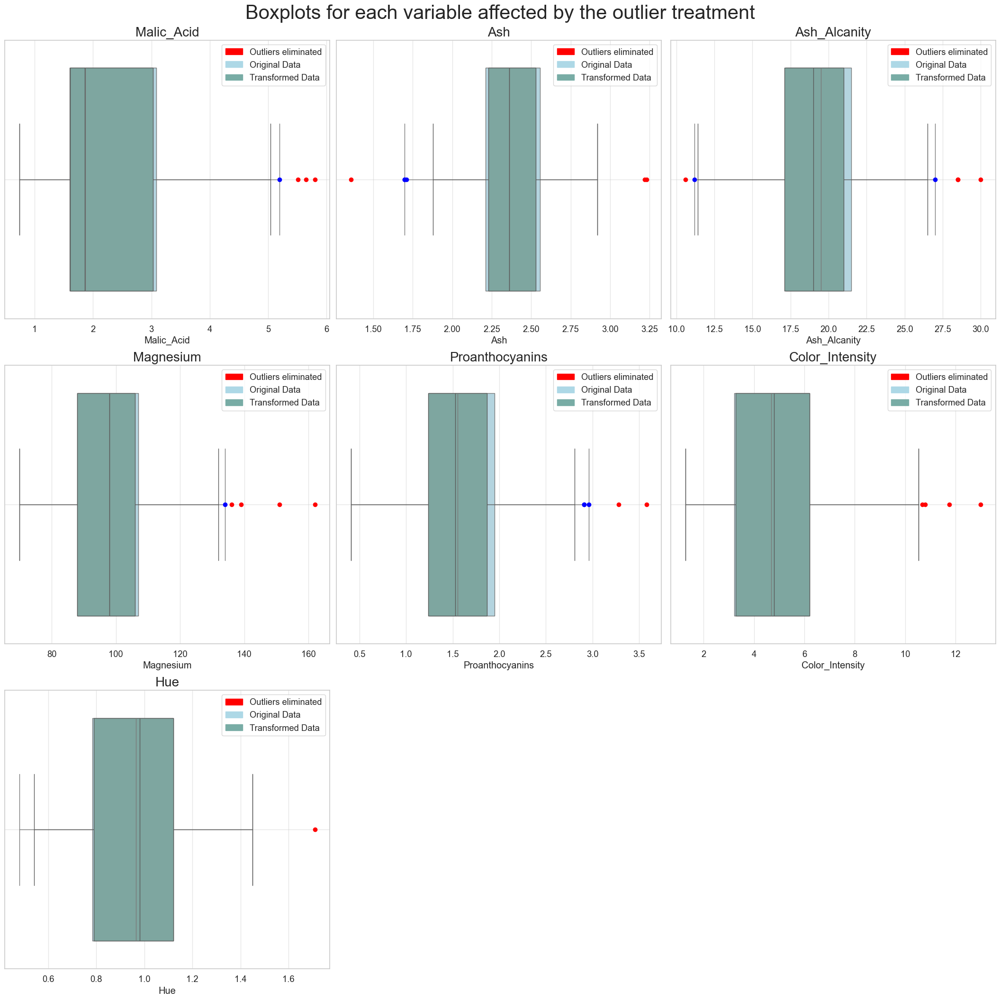

In [122]:
import matplotlib.patches as mpatches
sns.set_style('whitegrid')
sns.set_context("notebook", font_scale=1.2)

# Columns affected where selected by hand to not show every 13 boxplots
columns_affected = ['Malic_Acid', 'Ash', 'Ash_Alcanity', 'Magnesium', 'Proanthocyanins', 'Color_Intensity', 'Hue']

num_plots = len(data[columns_affected].columns)
total_cols = 3
total_rows = num_plots // total_cols + 1
fig, axs = plt.subplots(nrows=total_rows, ncols=total_cols,
                        figsize=(7*total_cols, 7*total_rows), constrained_layout=True)

flierprops_orig = dict(marker='o', markerfacecolor='red', markersize=6,
                       linestyle='none', markeredgecolor='red')
flierprops_transformed = dict(marker='o', markerfacecolor='blue', markersize=6,
                              linestyle='none', markeredgecolor='blue')

for i, var in enumerate(data[columns_affected].columns):
    row = i // total_cols
    pos = i % total_cols
    plot = sns.boxplot(x=var, data=data[columns_affected], ax=axs[row][pos], flierprops=flierprops_orig, color='lightblue')
    plot = sns.boxplot(x=var, data=data_transformed[columns_affected], ax=axs[row][pos], flierprops=flierprops_transformed, color='#78ACA5')
    plot.set_title(f'{var}', fontdict={'fontsize': 20})
    plot.grid(alpha=0.5)

    # Add legend
    red_patch = mpatches.Patch(color='red', label='Outliers eliminated')
    lightblue_patch = mpatches.Patch(color='lightblue', label='Original Data')
    otherblue_patch = mpatches.Patch(color='#78ACA5', label='Transformed Data')
    plot.legend(handles=[red_patch, lightblue_patch, otherblue_patch], loc='upper right')

# Remove empty subplots
if num_plots % total_cols:
    for ax in axs.flatten()[num_plots:]:
        ax.remove()

plt.suptitle('Boxplots for each variable affected by the outlier treatment', fontsize=30)
plt.show()

## Statistical distribution analysis with ProfileReport from ydata_profiling

The data exploration phase has provided us with valuable insights:

1. **ProfileReport Utility**: The ProfileReport was particularly useful at the beginning of our analysis. It guided the outlier treatment, provided statistical descriptions, and offered general measurements of the data. I've kept the ProfileReport in this notebook to track changes after outlier removal and to review general measurements as we implement machine learning models.

2. **Pairplot Observations**: The pairplot reveals that most of our variables do not have a linear relationship. This observation supports our decision to use Spearman calculations. Additionally, the diagonal of the pairplot shows that almost every variable can be treated as Gaussian distributed due to their bell shape. This information will be beneficial when creating models.


In [123]:
# Profile report about the data

# Using spearman correlation because we are dealing with non-linear relationships and,
# continuous relationships between the variables
profile_report = ProfileReport(data_transformed, title='Wine clustering profiling report',
                               explorative=True, correlations={"spearman": {"calculate": True}})

profile_report.to_file('../reports/wine_clustering_profiling_report.html')
profile_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

The `ProfileReport` generated a correlation matrix using the Spearman method. From this matrix, we identified the most significant relationships. These relationships have correlation coefficients greater than 0.7. The key relationships are as follows:

- `Flavanoids` and `OD280`
- `Flavanoids` and `Proanthocyanins`
- `Flavanoids` and `Total_Phenols`

Also, if we change the mask to be 0.8, the relationship that is the greatest is `Flavanoids` and `Total_Phenols`, which we can assure looking at the following pairplot or int he relationships section of the `ProfileReport`

In [124]:
matrix_correlations_from_report = profile_report._description_set.correlations['spearman']

# Mask to search for the most important relationships
mask = np.abs(matrix_correlations_from_report.values) > 0.8

# Get the relationships
relationships = [(matrix_correlations_from_report.columns[i], 
                  matrix_correlations_from_report.columns[j]) \
                 for i, j in zip(*np.where(mask)) if i != j]

# Convert each inner list to a tuple
relationships_tuples = [tuple(sorted(rel)) for rel in relationships]

# Use a set to remove duplicates
unique_relationships = list(set(relationships_tuples))
print(f'Relationships with a coefficient grater than 0.7: {unique_relationships}')

Relationships with a coefficient grater than 0.7: [('Flavanoids', 'Total_Phenols')]


<Figure size 1000x1000 with 0 Axes>

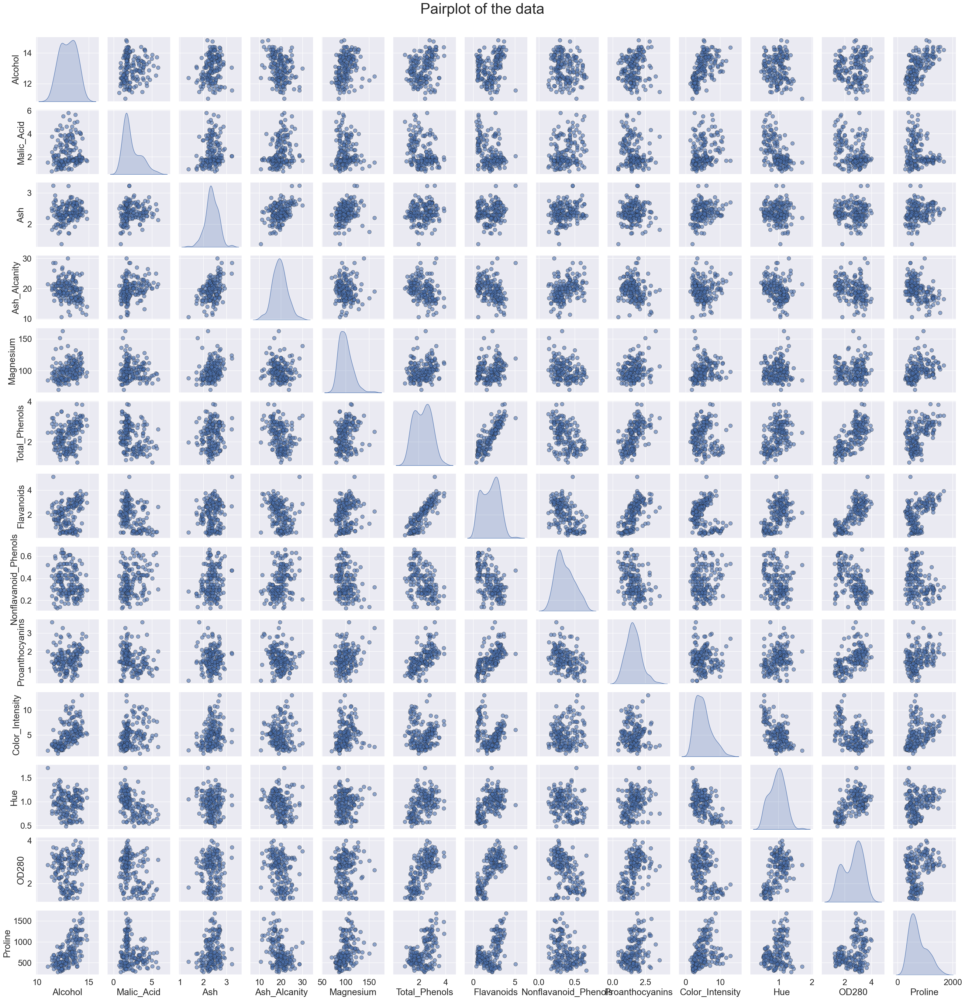

In [125]:
%matplotlib inline
sns.set(font_scale=1.8)
# Pairplot to visualize the relationships between the variables
plt.figure(figsize=(10,10))
pairplot = sns.pairplot(data, diag_kind='kde', plot_kws={'alpha': 0.6, 's': 80, 'edgecolor': 'k'})
pairplot.fig.suptitle("Pairplot of the data", y=1.02, size=35)
plt.show()

# Clustering analysis tests

To do the clustering analysis, firts we have to scale the data into a common scale. I choose StandardScaler due to the gaussian distribution that we can assume in our data columns based on the analysis of distribution made before. As the model I'm going to apply, (KMeans), is based on distances to cluster the data, it is better for the model to have the data in a common scale, that's why we are doing a data scaling.

Additionaly, I decided to make a hyperparameter tuning to select the best parameter for the KMeans model I will implement. This way, the Silhoutte score and WCSS, (within-cluster sum of squares), will be better.

In [126]:
# Data scaling
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_transformed)

# -- Doing hyperparameter tuning for KMeans model -- 

# Parameters that will be tunned
n_init_range = list(range(1, 10))
param_grid = {'n_init': n_init_range,
              'init': ['k-means++', 'random'],
              'max_iter': [100, 200, 300, 400, 500, 600]}

# Search of the best parameters with GridSearchCV from sklearn
grid = GridSearchCV(KMeans(), param_grid, cv=10, scoring='accuracy', refit='silhouette_score')
grid.fit(data_scaled)

# Best parameters selected in the grid search
print(grid.best_params_)

{'init': 'k-means++', 'max_iter': 100, 'n_init': 1}


Here, we implement the KMeans model for clusterization from sklearn, applying the max_iter, n_init and init parameters found in the above analysis. I am going to perform an analysis to select the best clusters, this will be based on the WCSS and Silhouette scores for the data.

WCSS (Within-Cluster Sum of Square) and Silhouette scores are two methods used to evaluate the quality of a clustering model, in this case, KMeans.

1. **WCSS**: This is the sum of the squared distance between each member of the cluster and its centroid. The idea is to minimize the distance of each point in a cluster from the centroid of that cluster. When we plot WCSS for different numbers of clusters (an "elbow plot"), the optimal number of clusters is usually where the decrease in WCSS becomes less pronounced, forming an "elbow" shape in the plot, that's where we select the optimal number of clusters.

2. **Silhouette Score**: This measures how close each sample in one cluster is to the samples in the neighboring clusters. Its value ranges from -1 to 1. A high value indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters. This metrics also helps us select the best number of clusters.

Based on these two metrics, I selected 3 clusters to train the KMeans model, because the two of them show that 3 is the best number of clusters.

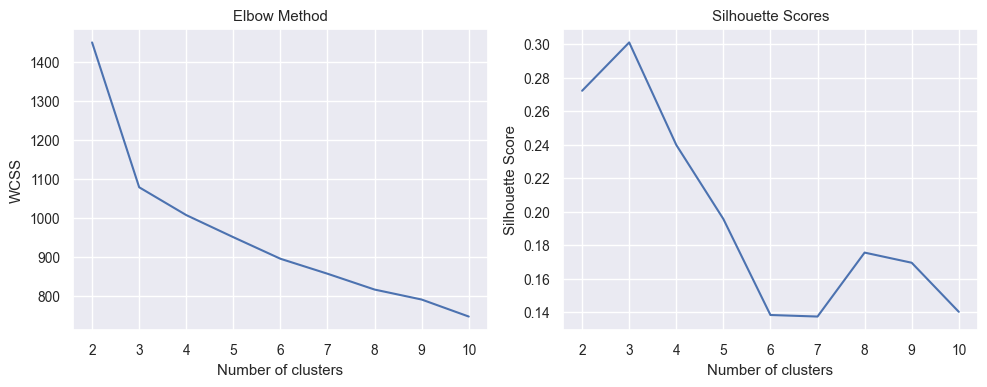

In [127]:
sns.set(font_scale=0.9)
wcss = [] #within-cluster sum of squares
silhouette_scores = []
max_clusters = 10

for i in range(2, max_clusters+1):
    # Initialize a KMeans object with i clusters, using the k-means++ initialization method,
    # a maximum of 100 iterations for a single run, and 1 runs with different centroid seeds
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=100, n_init=1, random_state=42)
    
    kmeans.fit(data_scaled)
    wcss.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(data_scaled, kmeans.labels_))

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

# Plot the WCSS and Silhouette values for each number of clusters
axs[0].plot(range(2, max_clusters+1), wcss)
axs[0].set_title('Elbow Method')
axs[0].set_xlabel('Number of clusters')
axs[0].set_ylabel('WCSS')

axs[1].plot(range(2, max_clusters+1), silhouette_scores)
axs[1].set_title('Silhouette Scores')
axs[1].set_xlabel('Number of clusters')
axs[1].set_ylabel('Silhouette Score')

plt.tight_layout()
plt.show()

The KMeans model performed well in the data provides, with a silhouette score of 0.3 and a WCSS of 1079, considering the amount of data to perform the clustering, (161 data rows), these are some good metrics.

In [129]:
# Training the KMeans model with the optimal number of clusters
optimal_clusters = 3
kmeans = KMeans(n_clusters=optimal_clusters, init='k-means++', max_iter=100, n_init=1, random_state=42)
pred_y = kmeans.fit_predict(data_scaled)

# Saving the model
from joblib import dump
dump(kmeans, '../models/model.joblib')

# Predicted clusters
data_transformed['Cluster'] = pred_y
data_transformed.groupby('Cluster').mean()

# Calculating the silhouette score for KMeans model
score = silhouette_score(data_scaled, pred_y)
inertia_score = kmeans.inertia_
print(f"Silhouette score: {round(score, 2)}")
print(f"Inertia score, (WCSS): {round(inertia_score, 2)}")

Silhouette score: 0.3
Inertia score, (WCSS): 1079.66


Here is the data grouped by Cluster and some descriptive statistical methods like the mean and standard deviation to recognize the distribution of the clusters.

In [130]:
data_transformed.groupby('Cluster').mean()

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline
Cluster,,,,,,,,,,,,,
0,12.277069,1.845345,2.259310,20.187931,91.086207,2.241034,2.067414,0.359310,1.560862,3.011207,1.060793,2.824138,506.172414
1,13.100889,3.284222,2.395333,21.006667,98.466667,1.640667,0.796889,0.448444,1.079333,6.889778,0.696889,1.696222,619.155556
2,13.756724,2.010000,2.442414,16.900000,106.034483,2.843793,2.987586,0.286897,1.898966,5.561897,1.060862,3.157069,1120.637931


In [131]:
data_transformed.groupby('Cluster').std()

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline
Cluster,,,,,,,,,,,,,
0,0.515606,0.882091,0.269254,2.578799,10.448343,0.539287,0.595305,0.118260,0.476490,0.811107,0.183813,0.456585,143.262872
1,0.501778,0.994520,0.198936,2.399754,11.367018,0.297156,0.320134,0.122826,0.316769,2.057795,0.117238,0.287183,123.993393
2,0.456829,0.694543,0.205138,2.337940,10.324499,0.340767,0.398925,0.066444,0.415699,1.221979,0.117149,0.360151,220.171600


Also, the pairplot is a good tool to see visually how the clusters are distributed in the data. We see that most of the features are well segmented in the clusters.

In [132]:
sns.set(font_scale=1.5)
plt.figure(figsize=(15, 15))

palette = sns.color_palette("dark", len(data_transformed['Cluster'].unique()))
g = sns.pairplot(data_transformed, hue='Cluster', diag_kind='kde', plot_kws={'alpha': 0.6}, palette=palette)
g.fig.suptitle("Pairplot of Transformed Data", y=1.02, fontsize=20)

# Making the legend bigger
plt.setp(g._legend.get_title(), fontsize='25')
plt.setp(g._legend.get_texts(), fontsize='23')

plt.show()